Summary: https://affective-meld.github.io/

View the project on GitHub: https://github.com/declare-lab/MELD/
- Details here: https://github.com/declare-lab/MELD/blob/master/README.md

Paper on ArXiv: https://arxiv.org/pdf/1810.02508

# 1. Download the raw data

In [1]:
# Mount Google Drive
# Re-run this cell every time you open this notebook
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Note: No need to re-run this cell
# Download the dataset
!wget https://web.eecs.umich.edu/~mihalcea/downloads/MELD.Raw.tar.gz

--2025-03-10 07:28:26--  https://web.eecs.umich.edu/~mihalcea/downloads/MELD.Raw.tar.gz
Resolving web.eecs.umich.edu (web.eecs.umich.edu)... 141.212.113.214
Connecting to web.eecs.umich.edu (web.eecs.umich.edu)|141.212.113.214|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10878146150 (10G) [application/x-gzip]
Saving to: ‘MELD.Raw.tar.gz’

MELD.Raw.tar.gz     100%[===================>]  10.13G  41.8MB/s    in 5m 39s  

2025-03-10 07:34:06 (30.6 MB/s) - ‘MELD.Raw.tar.gz’ saved [10878146150/10878146150]



# 2. Extract the data

In [ ]:
# Note: No need to re-run this cell
# Extract the tar.gz file
import tarfile
!tar -xvzf "/content/drive/MyDrive/CS5344 Project/Data and Codes/MELD.Raw.tar.gz"

# Check the extracted folder
!ls -l MELD.Raw

MELD.Raw/
MELD.Raw/train.tar.gz
MELD.Raw/dev.tar.gz
MELD.Raw/test_sent_emo.csv
MELD.Raw/._train_splits
MELD.Raw/dev_sent_emo.csv
MELD.Raw/README.txt
MELD.Raw/test.tar.gz
total 10621848
-rwxr-xr-x 1 99430124 132     120071 Sep 29  2018 dev_sent_emo.csv
-rw-r--r-- 1 99430124 132  776067297 Oct 17  2018 dev.tar.gz
-rwxr-xr-x 1 99430124 132       9822 Oct  5  2018 README.txt
-rwxr-xr-x 1 99430124 132     290841 Sep 29  2018 test_sent_emo.csv
-rw-r--r-- 1 99430124 132 2237023908 Oct  5  2018 test.tar.gz
-rw-r--r-- 1 99430124 132 7863231551 Nov  2  2018 train.tar.gz


In [ ]:
# Note: No need to re-run this cell
# Check extracted files
import os

dataset_path = "/content/MELD.Raw"
print("Extracted Files:", os.listdir(dataset_path))

Extracted Files: ['test_sent_emo.csv', 'README.txt', 'test.tar.gz', '._train_splits', 'dev.tar.gz', 'train.tar.gz', 'dev_sent_emo.csv']


In [ ]:
# Note: No need to re-run this cell
# Extract the compressed train, dev, and test files
def extract_tar_gz(file_path, destination):
    with tarfile.open(file_path, "r:gz") as tar:
        tar.extractall(destination)
    print(f"Extracted {file_path} to {destination}")

# Extract the datasets
extract_tar_gz(os.path.join(dataset_path, "train.tar.gz"), dataset_path)
extract_tar_gz(os.path.join(dataset_path, "dev.tar.gz"), dataset_path)
extract_tar_gz(os.path.join(dataset_path, "test.tar.gz"), dataset_path)

# Verify extracted files
print("\nFiles after extraction:", os.listdir(dataset_path))

Extracted /content/MELD.Raw/train.tar.gz to /content/MELD.Raw
Extracted /content/MELD.Raw/dev.tar.gz to /content/MELD.Raw
Extracted /content/MELD.Raw/test.tar.gz to /content/MELD.Raw

Files after extraction: ['test_sent_emo.csv', 'README.txt', 'test.tar.gz', '._train_splits', 'train_splits', 'output_repeated_splits_test', '._output_repeated_splits_test', 'train_sent_emo.csv', 'dev.tar.gz', 'train.tar.gz', 'dev_sent_emo.csv', 'dev_splits_complete']


In [ ]:
# Note: No need to re-run this cell
# Remove unnecessary files
!rm /content/MELD.Raw.tar.gz
!rm /content/MELD.Raw/train.tar.gz
!rm /content/MELD.Raw/dev.tar.gz
!rm /content/MELD.Raw/test.tar.gz

rm: cannot remove '/content/MELD.Raw.tar.gz': No such file or directory


In [ ]:
# Note: No need to re-run this cell
# Rename the extracted files and folders
base_path = "/content/MELD.Raw"

os.rename(f"{base_path}/train_splits/", f"{base_path}/train_videos/")
os.rename(f"{base_path}/dev_splits_complete/", f"{base_path}/dev_videos/")
os.rename(f"{base_path}/output_repeated_splits_test/", f"{base_path}/test_videos/")

os.rename(f"{base_path}/train_sent_emo.csv", f"{base_path}/train.csv")
os.rename(f"{base_path}/dev_sent_emo.csv", f"{base_path}/dev.csv")
os.rename(f"{base_path}/test_sent_emo.csv", f"{base_path}/test.csv")

In [ ]:
# Note: No need to re-run this cell
# Count the no. of files in each of the extracted folder
!find /content/MELD.Raw/train_videos -type f | wc -l
!find /content/MELD.Raw/dev_videos -type f | wc -l
!find /content/MELD.Raw/test_videos -type f | wc -l

9989
1112
4807


In [ ]:
# Note: No need to re-run this cell
# Copy over to Google Drive folder
!cp /content/MELD.Raw.tar.gz "/content/drive/MyDrive/CS5344 Project/Data and Codes/"

!cp /content/MELD.Raw/train.csv "/content/drive/MyDrive/CS5344 Project/Data and Codes/"
!cp /content/MELD.Raw/dev.csv "/content/drive/MyDrive/CS5344 Project/Data and Codes/"
!cp /content/MELD.Raw/test.csv "/content/drive/MyDrive/CS5344 Project/Data and Codes/"

!mv /content/MELD.Raw/train_videos "/content/drive/MyDrive/CS5344 Project/Data and Codes/"
!mv /content/MELD.Raw/dev_videos "/content/drive/MyDrive/CS5344 Project/Data and Codes/"
!mv /content/MELD.Raw/test_videos "/content/drive/MyDrive/CS5344 Project/Data and Codes/"

cp: cannot stat '/content/MELD.Raw.tar.gz': No such file or directory


In [ ]:
# Note: No need to re-run this cell
# Check file count before/after copying over
!find "/content/drive/MyDrive/CS5344 Project/Data and Codes/train_videos" -type f | wc -l
!find "/content/drive/MyDrive/CS5344 Project/Data and Codes/dev_videos" -type f | wc -l
!find "/content/drive/MyDrive/CS5344 Project/Data and Codes/test_videos" -type f | wc -l

9989
1112
4807


# 3a. Look at the extracted files - text data

In [3]:
# Load the dataset using Pandas
import pandas as pd
import os

pd.set_option('display.max_colwidth', None) # Don't truncate the data when printed

dataset_path = "/content/drive/MyDrive/CS5344 Project/Data and Codes/"
train_df = pd.read_csv(os.path.join(dataset_path, "train.csv"))
dev_df = pd.read_csv(os.path.join(dataset_path, "dev.csv"))
test_df = pd.read_csv(os.path.join(dataset_path, "test.csv"))

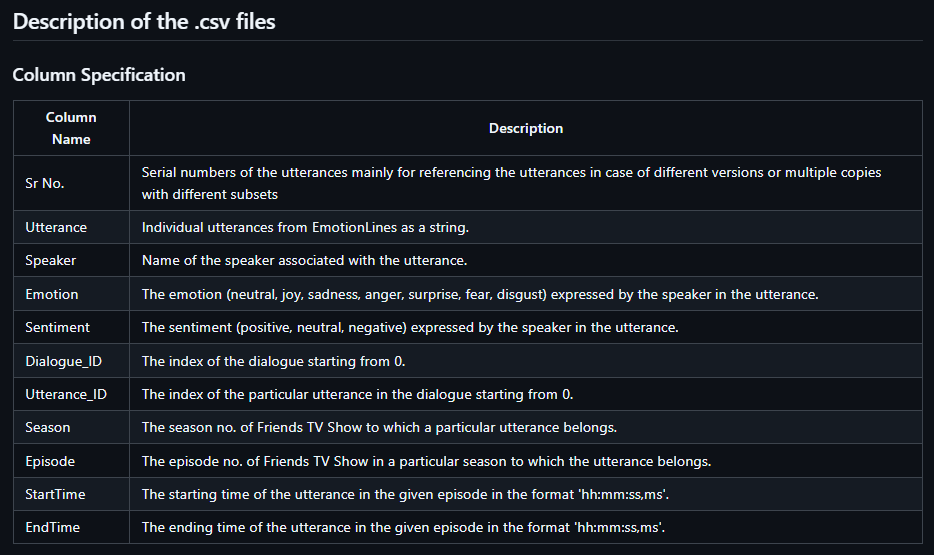

In [4]:
# Preview the Train dataset
print("\nTrain Dataset Preview:")
display(train_df.head())

# Preview the Development dataset
print("\nDevelopment Dataset Preview:")
display(dev_df.head())

# Preview the Test dataset
print("\nTest Dataset Preview:")
display(test_df.head())


Train Dataset Preview:


,Sr No.,Utterance,Speaker,Emotion,Sentiment,Dialogue_ID,Utterance_ID,Season,Episode,StartTime,EndTime
0,1,also I was the point person on my companys transition from the KL-5 to GR-6 system.,Chandler,neutral,neutral,0,0,8,21,"00:16:16,059","00:16:21,731"
1,2,You mustve had your hands full.,The Interviewer,neutral,neutral,0,1,8,21,"00:16:21,940","00:16:23,442"
2,3,That I did. That I did.,Chandler,neutral,neutral,0,2,8,21,"00:16:23,442","00:16:26,389"
3,4,So lets talk a little bit about your duties.,The Interviewer,neutral,neutral,0,3,8,21,"00:16:26,820","00:16:29,572"
4,5,My duties? All right.,Chandler,surprise,positive,0,4,8,21,"00:16:34,452","00:16:40,917"



Development Dataset Preview:


,Sr No.,Utterance,Speaker,Emotion,Sentiment,Dialogue_ID,Utterance_ID,Season,Episode,StartTime,EndTime
0,1,"Oh my God, hes lost it. Hes totally lost it.",Phoebe,sadness,negative,0,0,4,7,"00:20:57,256","00:21:00,049"
1,2,What?,Monica,surprise,negative,0,1,4,7,"00:21:01,927","00:21:03,261"
2,3,"Or! Or, we could go to the bank, close our accounts and cut them off at the source.",Ross,neutral,neutral,1,0,4,4,"00:12:24,660","00:12:30,915"
3,4,Youre a genius!,Chandler,joy,positive,1,1,4,4,"00:12:32,334","00:12:33,960"
4,5,"Aww, man, now we wont be bank buddies!",Joey,sadness,negative,1,2,4,4,"00:12:34,211","00:12:37,505"



Test Dataset Preview:


,Sr No.,Utterance,Speaker,Emotion,Sentiment,Dialogue_ID,Utterance_ID,Season,Episode,StartTime,EndTime
0,1,Why do all youre coffee mugs have numbers on the bottom?,Mark,surprise,positive,0,0,3,19,"00:14:38,127","00:14:40,378"
1,2,"Oh. Thats so Monica can keep track. That way if one on them is missing, she can be like, Wheres number 27?!",Rachel,anger,negative,0,1,3,19,"00:14:40,629","00:14:47,385"
2,3,Y'know what?,Rachel,neutral,neutral,0,2,3,19,"00:14:56,353","00:14:57,520"
3,19,"Come on, Lydia, you can do it.",Joey,neutral,neutral,1,0,1,23,"0:10:44,769","0:10:46,146"
4,20,Push!,Joey,joy,positive,1,1,1,23,"0:10:46,146","0:10:46,833"


In [5]:
# Check dataset information
print("\nTrain Dataset Info:")
train_df.info()

print("\nDataset Columns:", train_df.columns)

print("\nDevelopment Dataset Info:")
dev_df.info()

print("\nDataset Columns:", dev_df.columns)

print("\nTest Dataset Info:")
test_df.info()

print("\nDataset Columns:", test_df.columns)


Train Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9989 entries, 0 to 9988
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Sr No.        9989 non-null   int64 
 1   Utterance     9989 non-null   object
 2   Speaker       9989 non-null   object
 3   Emotion       9989 non-null   object
 4   Sentiment     9989 non-null   object
 5   Dialogue_ID   9989 non-null   int64 
 6   Utterance_ID  9989 non-null   int64 
 7   Season        9989 non-null   int64 
 8   Episode       9989 non-null   int64 
 9   StartTime     9989 non-null   object
 10  EndTime       9989 non-null   object
dtypes: int64(5), object(6)
memory usage: 858.6+ KB

Dataset Columns: Index(['Sr No.', 'Utterance', 'Speaker', 'Emotion', 'Sentiment', 'Dialogue_ID',
       'Utterance_ID', 'Season', 'Episode', 'StartTime', 'EndTime'],
      dtype='object')

Development Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1109 ent

# 3b. Look at the extracted files - MP4 (video) data

In [6]:
# Find all MP4 files in the dataset
import os

video_files = []
for root, _, files in os.walk("/content/drive/MyDrive/CS5344 Project/Data and Codes/"):
    for file in files:
        if file.endswith(".mp4"):
            video_files.append(os.path.join(root, file))

# Print a few video file paths
print("Total MP4 files found:", len(video_files))
print("\nFirst 5 video files:\n", video_files[:5])

Total MP4 files found: 15908

First 5 video files:
 ['/content/drive/MyDrive/CS5344 Project/Data and Codes/dev_videos/dia15_utt4.mp4', '/content/drive/MyDrive/CS5344 Project/Data and Codes/dev_videos/dia15_utt7.mp4', '/content/drive/MyDrive/CS5344 Project/Data and Codes/dev_videos/dia16_utt0.mp4', '/content/drive/MyDrive/CS5344 Project/Data and Codes/dev_videos/dia16_utt1.mp4', '/content/drive/MyDrive/CS5344 Project/Data and Codes/dev_videos/dia16_utt2.mp4']


Displaying Frame 1


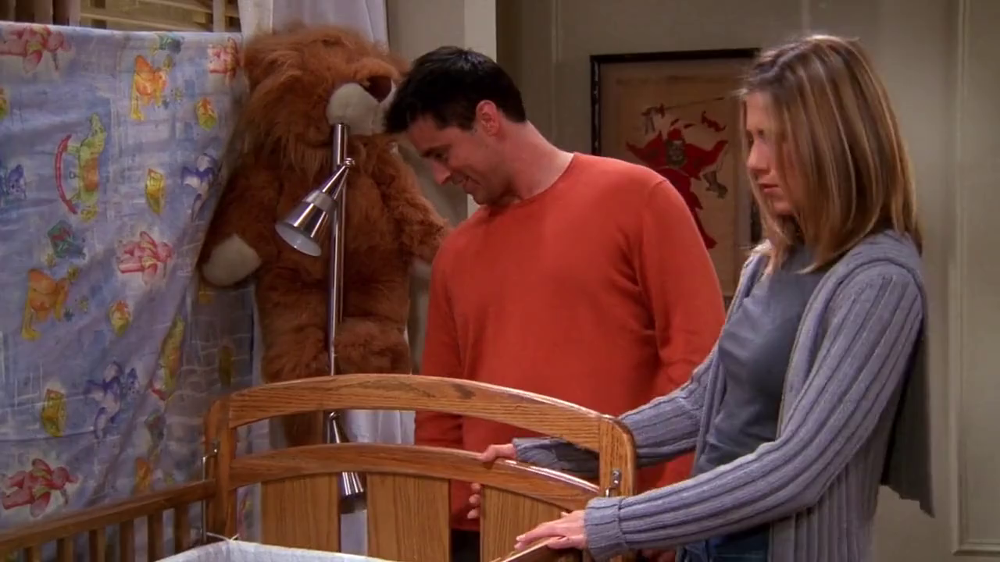

Displaying Frame 2


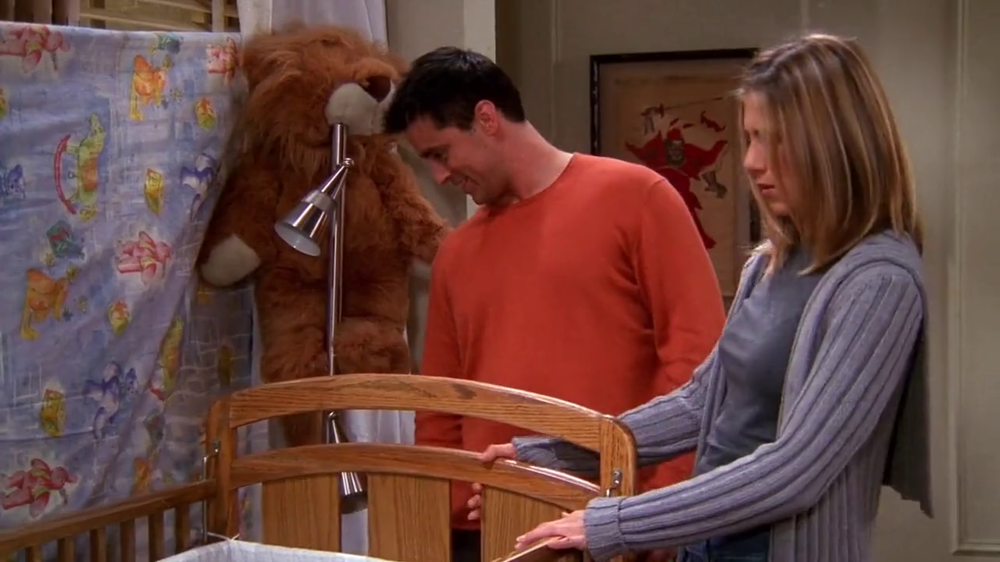

Displaying Frame 3


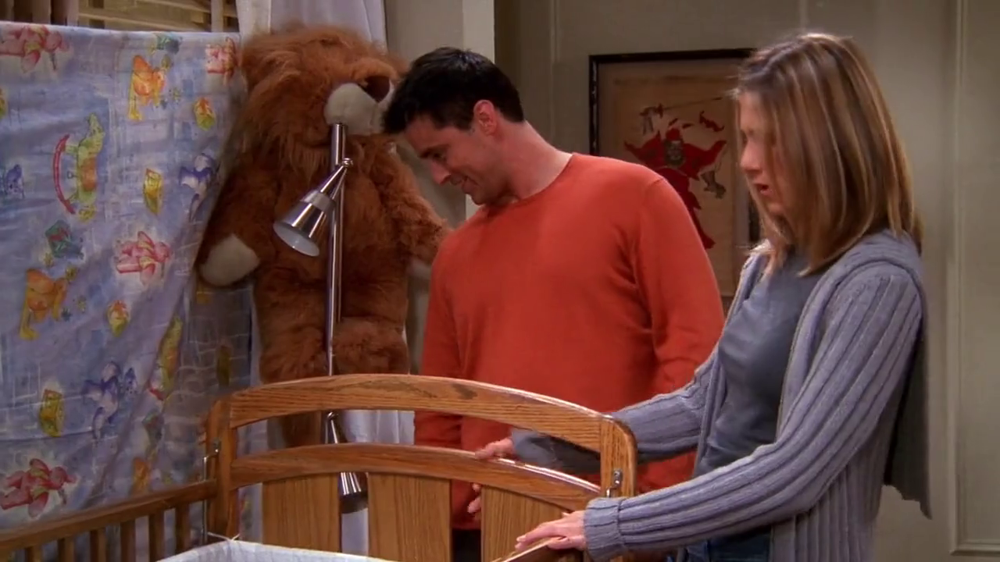

Displaying Frame 4


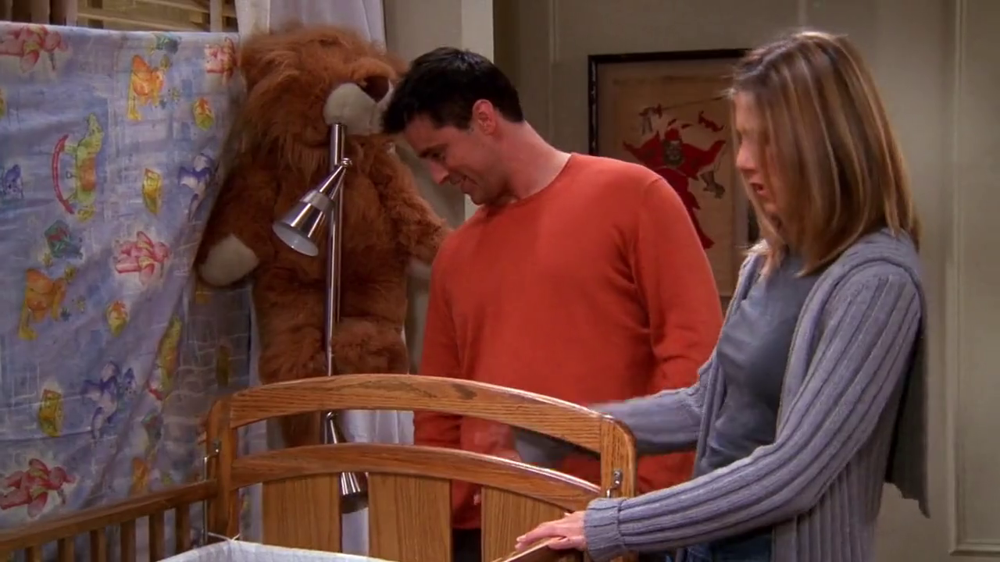

Displaying Frame 5


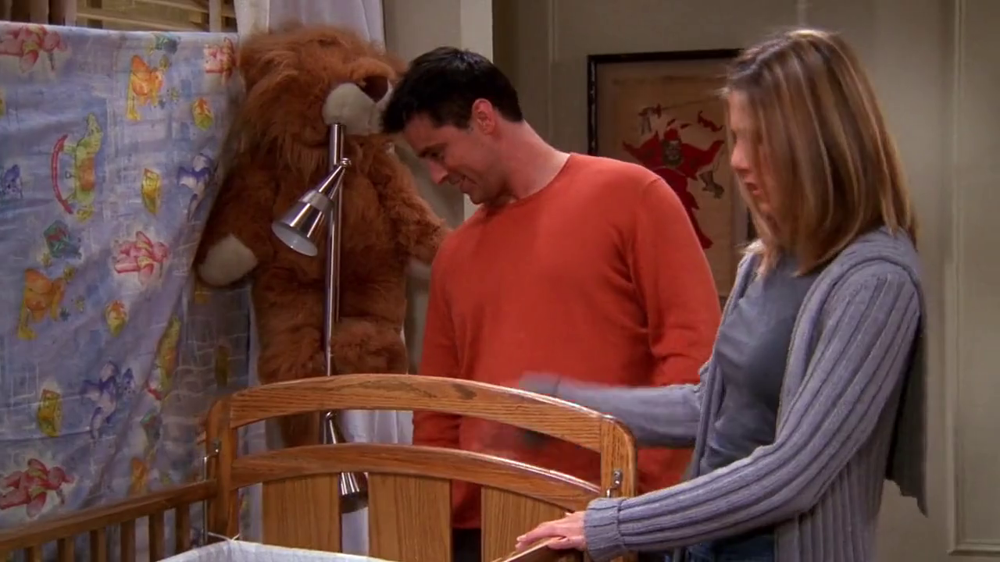

In [7]:
import cv2
from google.colab.patches import cv2_imshow

# Select a sample video file (change the index if needed)
video_path = video_files[0]

# Open the video file
cap = cv2.VideoCapture(video_path)

# Read and display the first few frames
frame_count = 0
while cap.isOpened() and frame_count < 5:
    ret, frame = cap.read()
    if not ret:
        break

    print(f"Displaying Frame {frame_count+1}")
    cv2_imshow(frame)  # Display in Colab
    frame_count += 1

cap.release()
cv2.destroyAllWindows()

# 3c. Sample record - video and corresponding text data

In [8]:
from moviepy.editor import VideoFileClip

# Select a sample video
video_path = video_files[0]

# Load and display the video
clip = VideoFileClip(video_path)
clip.ipython_display(width=700)

  if event.key is 'enter':



Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



t:  93%|█████████▎| 55/59 [00:00<00:00, 79.20it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.11/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file /content/drive/MyDrive/CS5344 Project/Data and Codes/dev_videos/dia15_utt4.mp4, 2764800 bytes wanted but 0 bytes read,at frame 58/59, at time 2.42/2.42 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [9]:
# Extract the corresponding .csv record given a MP4 path e.g. 'MELD.Raw/train_splits/dia632_utt5.mp4'
def get_csv_record(filename):
    """
    Given a filename (e.g., 'MELD.Raw/train_splits/dia632_utt5.mp4'), retrieves the corresponding record from the corresponding folder.

    :param df: The dataframe containing the data.
    :param filename: The video filename with the folder path (e.g., 'MELD.Raw/train_splits/dia632_utt5.mp4').
    :return: The corresponding record from the dataframe or an error message.
    """
    # Extract the folder and video filename from the full path
    folder = filename.split('/')[6]
    dialogue_id = int(filename.split('dia')[1].split('_')[0])
    utterance_id = int(filename.split('utt')[1].split('.mp4')[0])

    # Filter the dataframe for the corresponding record
    if folder == 'train_videos':
        record = train_df[(train_df['Dialogue_ID'] == dialogue_id) & (train_df['Utterance_ID'] == utterance_id)]
    elif folder == 'dev_videos':
        record = dev_df[(dev_df['Dialogue_ID'] == dialogue_id) & (dev_df['Utterance_ID'] == utterance_id)]
    elif folder == 'test_videos':
        record = test_df[(test_df['Dialogue_ID'] == dialogue_id) & (test_df['Utterance_ID'] == utterance_id)]

    # Return the record if found
    if not record.empty:
        print(filename)
        display(record)
        return record
    else:
        return f"No record found for file: {filename}"

In [10]:
# Extract and display the corresponding .csv record of a MP4 path
record = get_csv_record(video_path)

/content/drive/MyDrive/CS5344 Project/Data and Codes/dev_videos/dia15_utt4.mp4


,Sr No.,Utterance,Speaker,Emotion,Sentiment,Dialogue_ID,Utterance_ID,Season,Episode,StartTime,EndTime
162,168,Wow! Whoa-whoa whats under the covers?,Rachel,surprise,negative,15,4,8,7,"00:21:05,055","00:21:07,473"


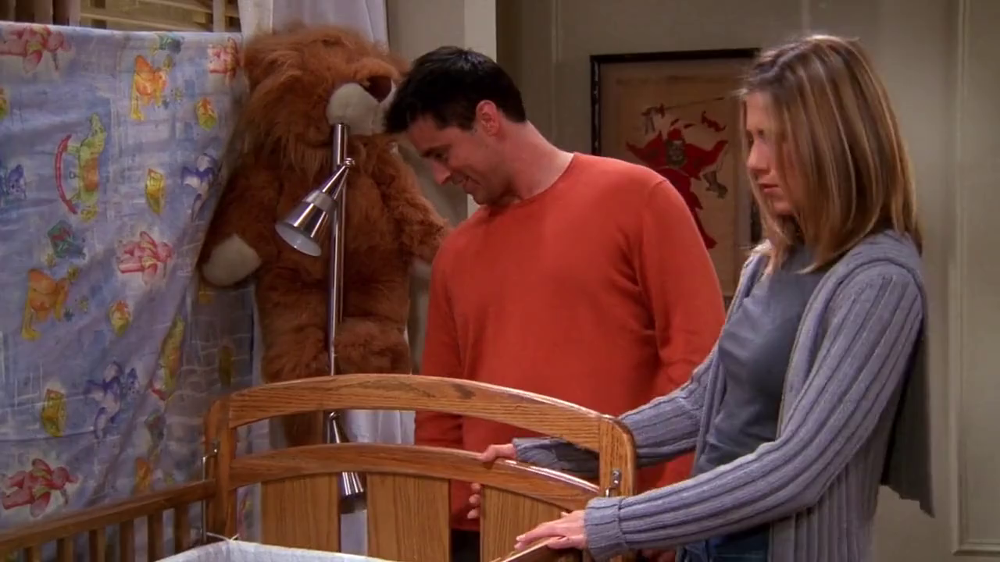

In [11]:
# Extracting frames from a video - for preview
def extract_frame(video_path, frame_num=0):
    cap = cv2.VideoCapture(video_path)
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_num)  # Move to the desired frame
    ret, frame = cap.read()
    cap.release()

    if ret:
        cv2_imshow(frame)  # Show the frame in Colab
    else:
        print("Error: Could not read frame.")

# Test on the first video
extract_frame(video_path)